In [94]:
from icecream import ic
import numpy as np
from skimage.restoration import unwrap_phase
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from miscellaneous.loader import load_image
from miscellaneous.propagator import angular_spectrum_band_limited
from miscellaneous.tie import FFTSolver2D

In [95]:
file = '../../../generation/image/BMSTU 1024x1024.png'
phase = load_image(file) + 0.2

In [96]:
i_amplitude = 0.5
intensity = i_amplitude * np.ones(phase.shape)

mean = 0.0
standard_deviation = 0.001
noise = np.random.normal(mean, standard_deviation, size=intensity.shape)
intensity += noise
complex_field_back_propagation = np.sqrt(intensity) * np.exp(1j * phase)

noise = np.random.normal(mean, standard_deviation, size=intensity.shape)
intensity += noise
complex_field_forward_propagation = np.sqrt(intensity) * np.exp(1j * phase)

In [97]:
px_size = 0.000005  # 5 mkm
wavelength = 0.000000555  # 555 nm

distances = np.array([0.00005, 0.00009, 0.0001, 0.0002, 0.00035, 0.0005, 0.00065, 0.0008, 0.00095, 0.0011, 0.0013, 0.0015, 0.002, 0.0025, 0.003, 0.0035])
forward_propagated_fields = []
for distance in distances:
    ic(distance)
    complex_field = np.copy(complex_field_forward_propagation)
    forward_propagated_fields.append(angular_spectrum_band_limited(complex_field, distance, wavelength, px_size))

ic| distance: 5e-05
ic| distance: 9e-05
ic| distance: 0.0001
ic| distance: 0.0002
ic| distance: 0.00035
ic| distance: 0.0005
ic| distance: 0.00065
ic| distance: 0.0008
ic| distance: 0.00095
ic| distance: 0.0011
ic| distance: 0.0013
ic| distance: 0.0015
ic| distance: 0.002
ic| distance: 0.0025
ic| distance: 0.003
ic| distance: 0.0035


ic| 'Амплитуды волн, распространеяющихся в прямом направлении.'


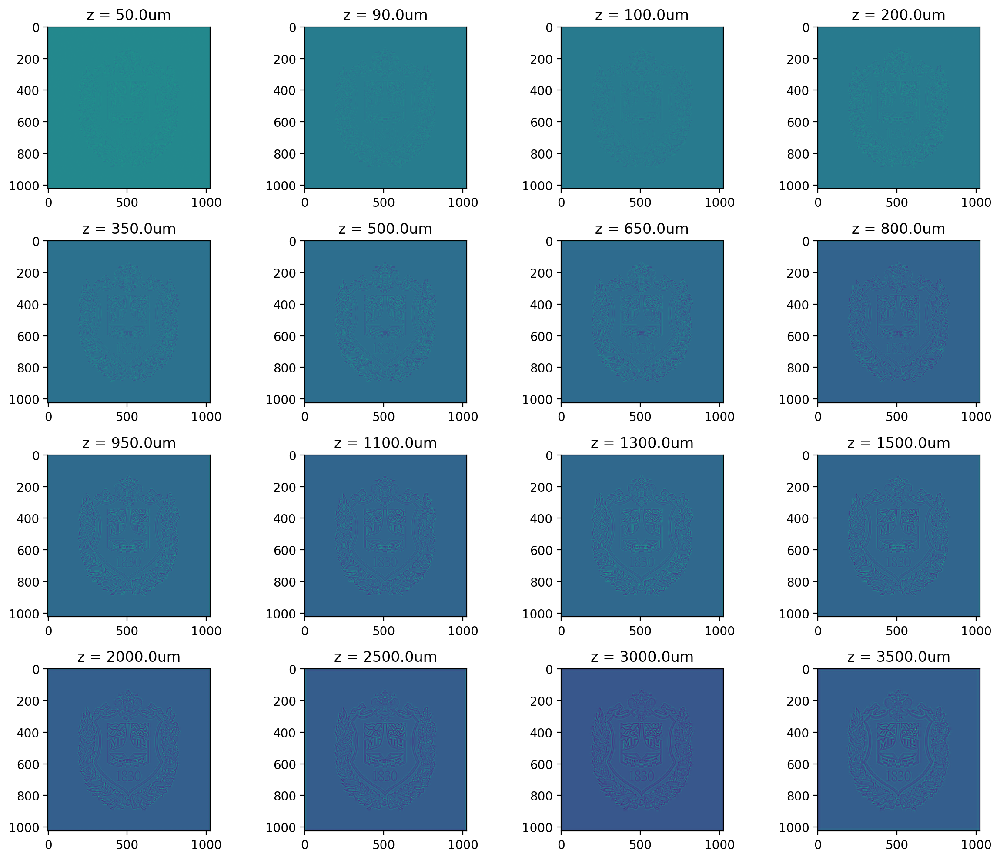

In [98]:
fig, ax_arr = plt.subplots(4, 4, figsize=(12,10), dpi=200)

current_field_counter = 0
for i in range(4):
    for j in range(4):
        ax_arr[i,j].imshow(np.abs(forward_propagated_fields[current_field_counter])**2)
        ax_arr[i,j].set_title(f'z = {distances[current_field_counter] * 1000000}um')
        current_field_counter += 1

ic('Амплитуды волн, распространеяющихся в прямом направлении.')
fig.tight_layout()
plt.show()

ic| 'Фазы волн, распространеяющихся в прямом направлении.'


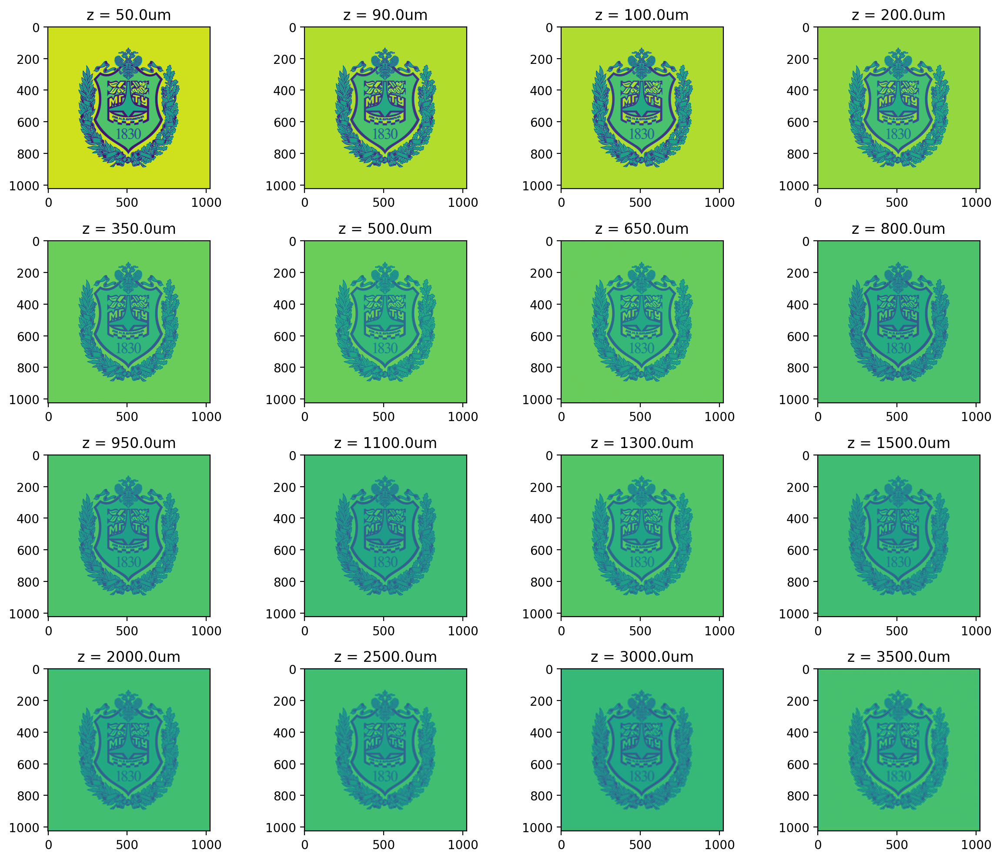

In [99]:
fig, ax_arr = plt.subplots(4, 4, figsize=(12,10), dpi=200)

current_field_counter = 0
for i in range(4):
    for j in range(4):
        ax_arr[i,j].imshow(unwrap_phase(np.angle(forward_propagated_fields[current_field_counter])))
        ax_arr[i,j].set_title(f'z = {distances[current_field_counter] * 1000000}um')
        current_field_counter += 1

ic('Фазы волн, распространеяющихся в прямом направлении.')
fig.tight_layout()
plt.show()

In [100]:
negative_distances = np.array([-1 * distance for distance in distances])
back_propagated_fields = []
for distance in negative_distances:
    ic(distance)
    complex_field = np.copy(complex_field_back_propagation)
    back_propagated_fields.append(angular_spectrum_band_limited(complex_field, distance, wavelength, px_size))

ic| distance: -5e-05
ic| distance: -9e-05
ic| distance: -0.0001
ic| distance: -0.0002
ic| distance: -0.00035
ic| distance: -0.0005
ic| distance: -0.00065
ic| distance: -0.0008
ic| distance: -0.00095
ic| distance: -0.0011
ic| distance: -0.0013
ic| distance: -0.0015
ic| distance: -0.002
ic| distance: -0.0025
ic| distance: -0.003
ic| distance: -0.0035


ic| 'Амплитуды волн, распространеяющихся в обратном направлении.'


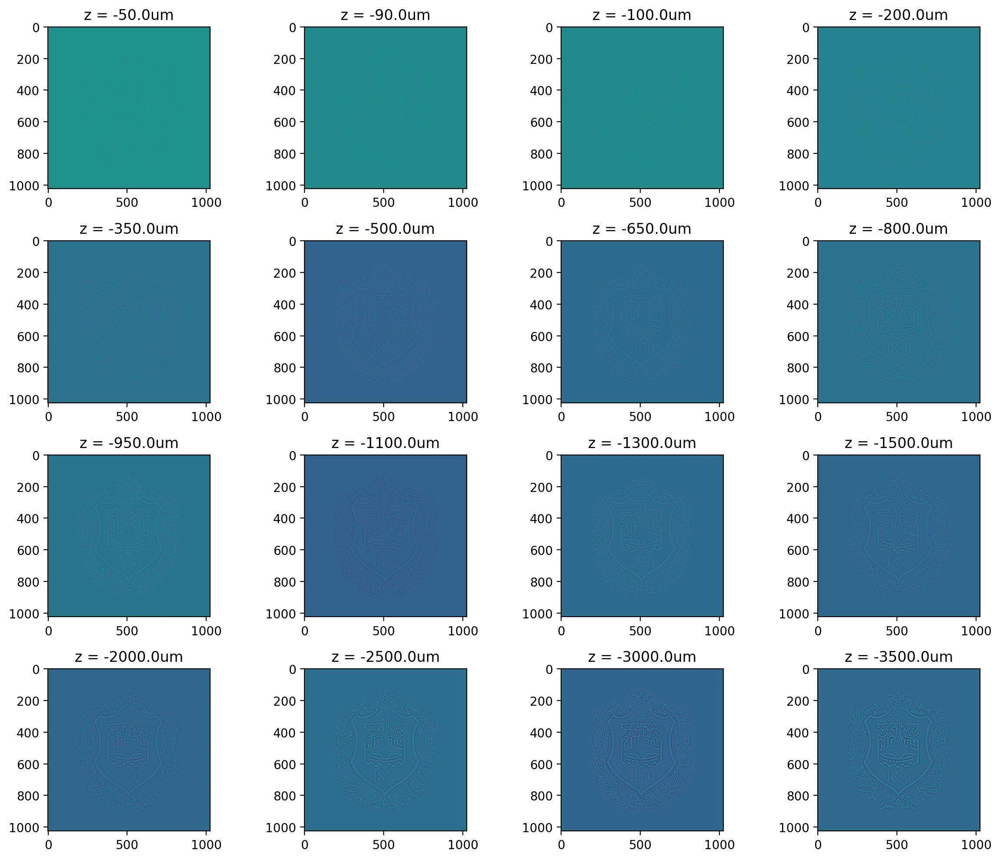

In [101]:
fig, ax_arr = plt.subplots(4, 4, figsize=(12,10), dpi=200)

current_field_counter = 0
for i in range(4):
    for j in range(4):
        ax_arr[i,j].imshow(np.abs(back_propagated_fields[current_field_counter])**2)
        ax_arr[i,j].set_title(f'z = {negative_distances[current_field_counter] * 1000000}um')
        current_field_counter += 1

ic('Амплитуды волн, распространеяющихся в обратном направлении.')
fig.tight_layout()
plt.show()

ic| 'Фазы волн, распространеяющихся в обратном направлении.'


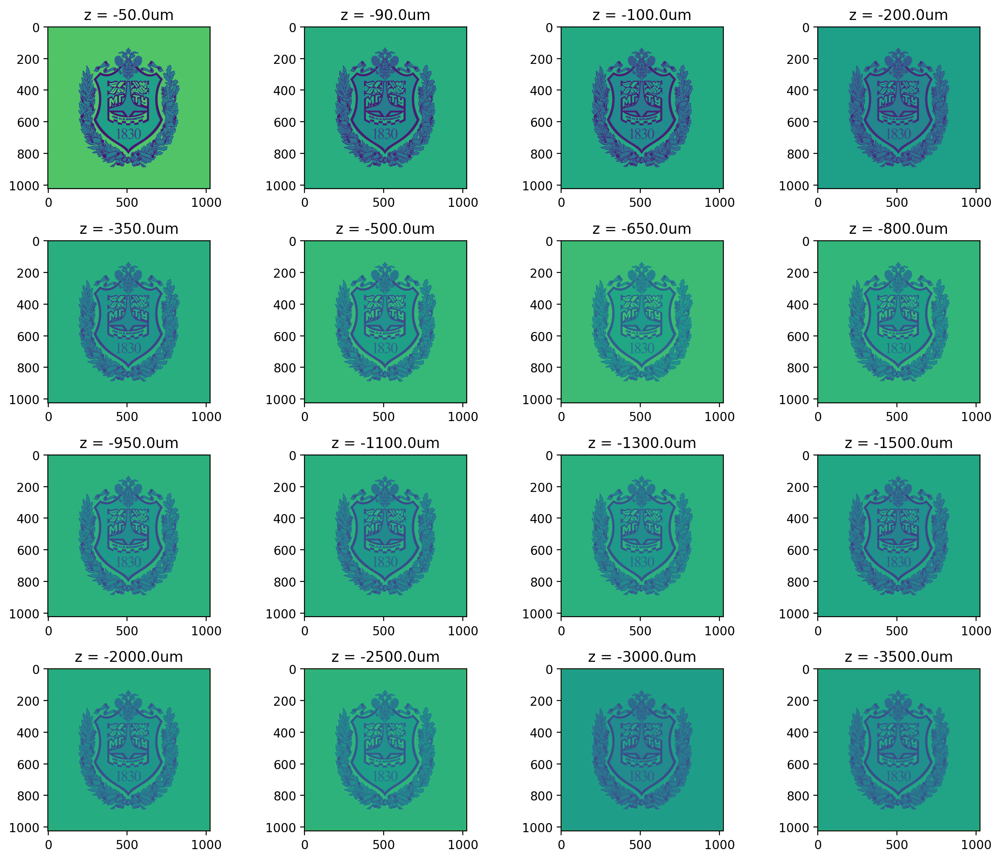

In [102]:
fig, ax_arr = plt.subplots(4, 4, figsize=(12,10), dpi=200)

current_field_counter = 0
for i in range(4):
    for j in range(4):
        ax_arr[i,j].imshow(unwrap_phase(np.angle(back_propagated_fields[current_field_counter])))
        ax_arr[i,j].set_title(f'z = {negative_distances[current_field_counter] * 1000000}um')
        current_field_counter += 1

ic('Фазы волн, распространеяющихся в обратном направлении.')
fig.tight_layout()
plt.show()

In [103]:
retrieved_phases = {}
for dz, i in zip(distances, range(len(distances))):
    ic(dz)
    intensities = [np.abs(field) ** 2 for field in [forward_propagated_fields[i], back_propagated_fields[i]]]

    dz = 2 * dz
    dz = - dz
    threshold = 0.1

    solver = FFTSolver2D(intensities, dz, wavelength, px_size)
    retrieved_phases[-dz] = solver.solve(threshold)

tie_distances = list(retrieved_phases.keys())

ic| dz: 5e-05
ic| dz: 9e-05
ic| dz: 0.0001
ic| dz: 0.0002
ic| dz: 0.00035
ic| dz: 0.0005
ic| dz: 0.00065
ic| dz: 0.0008
ic| dz: 0.00095
ic| dz: 0.0011
ic| dz: 0.0013
ic| dz: 0.0015
ic| dz: 0.002
ic| dz: 0.0025
ic| dz: 0.003
ic| dz: 0.0035


ic| 'TIE фазы волн.'


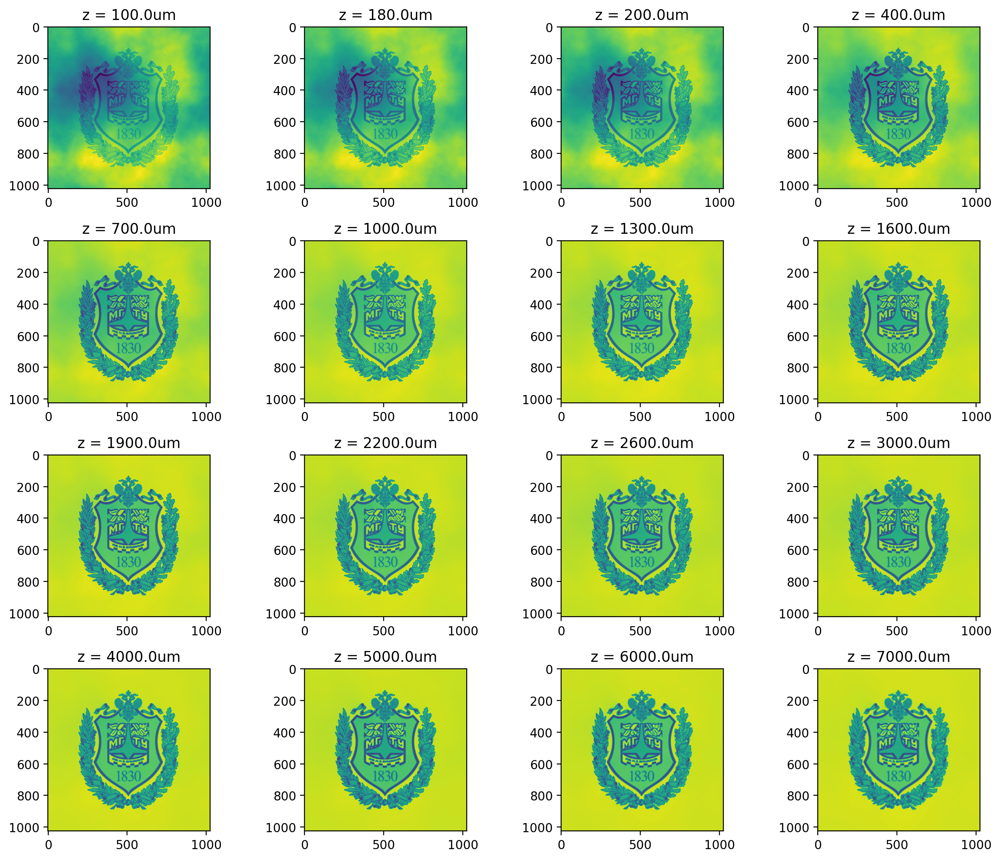

In [104]:
fig, ax_arr = plt.subplots(4, 4, figsize=(12,10), dpi=200)

current_field_counter = 0
for i in range(4):
    for j in range(4):
        ax_arr[i,j].imshow(retrieved_phases[tie_distances[current_field_counter]])
        ax_arr[i,j].set_title(f'z = {tie_distances[current_field_counter] * 1000000}um')
        current_field_counter += 1

ic('TIE фазы волн.')
fig.tight_layout()
plt.show()

In [105]:
def find_power(data:np.ndarray):
    def calculate_row_power(a):
        th = 0.0001
        row_power = 0
        for i in range(a.size - 1):
            if (a[i+1] - a[i]) ** 2 >= th: row_power += a[i+1]**2
        return row_power

    return np.sum(np.apply_along_axis(calculate_row_power, 0, data)) + \
           np.sum(np.apply_along_axis(calculate_row_power, 1, data))

powers = {}

for dz, phase in retrieved_phases.items():
    powers[dz] = find_power(phase)
    ic(dz, powers[dz])

ic| dz: 0.0001, powers[dz]: 127766.80193047685
ic| dz: 0.00018, powers[dz]: 84434
ic| dz: 0.0002, powers[dz]: 81943
ic| dz: 0.0004, powers[dz]: 70360
ic| dz: 0.0007, powers[dz]: 68125
ic| dz: 0.001, powers[dz]: 70283
ic| dz: 0.0013, powers[dz]: 71792
ic| dz: 0.0016, powers[dz]: 72065
ic| dz: 0.0019, powers[dz]: 72251
ic| dz: 0.0022, powers[dz]: 71497
ic| dz: 0.0026, powers[dz]: 70331
ic| dz: 0.003, powers[dz]: 69204
ic| dz: 0.004, powers[dz]: 67026
ic| dz: 0.005, powers[dz]: 63516
ic| dz: 0.006, powers[dz]: 60293
ic| dz: 0.007, powers[dz]: 58891


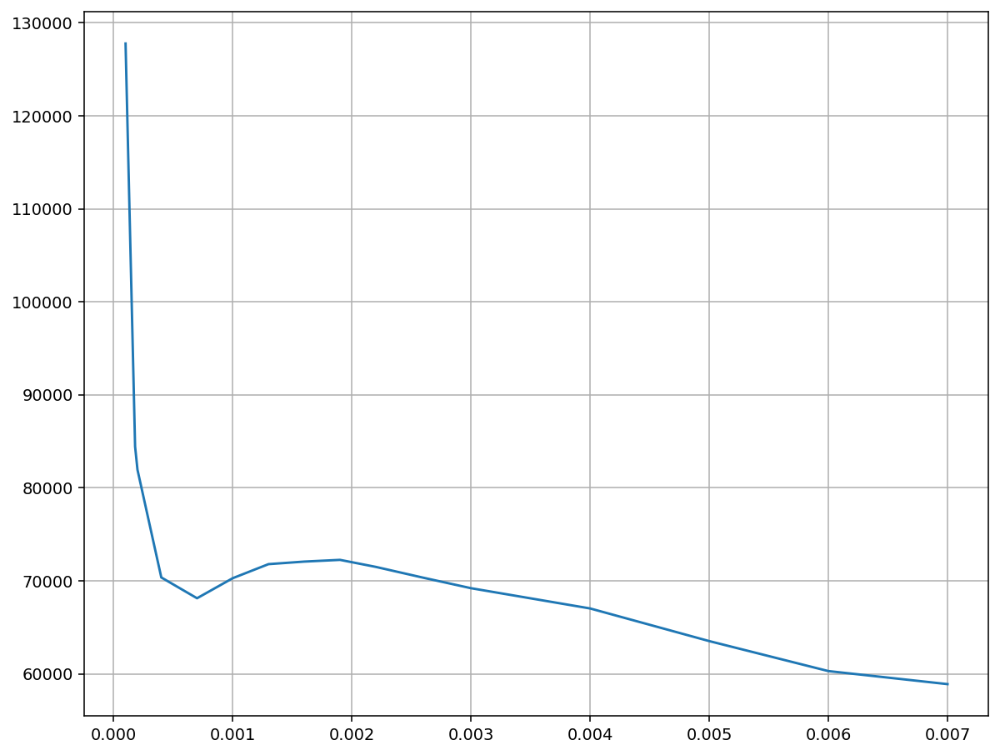

In [106]:
figure(figsize=(10, 8), dpi=140)
plt.plot(powers.keys(), powers.values())
plt.grid()
plt.show()

In [107]:
def find_second_local_maximum(array: list):
    i = 0
    while i + 1 < len(array) and array[i + 1] > array[i]:
        i += 1
    return len(array) - i - 1

dz_with_best_power = list(powers.keys())[find_second_local_maximum(list(reversed(powers.values())))]
focused_image = retrieved_phases[dz_with_best_power]

dz_with_best_power

0.0019

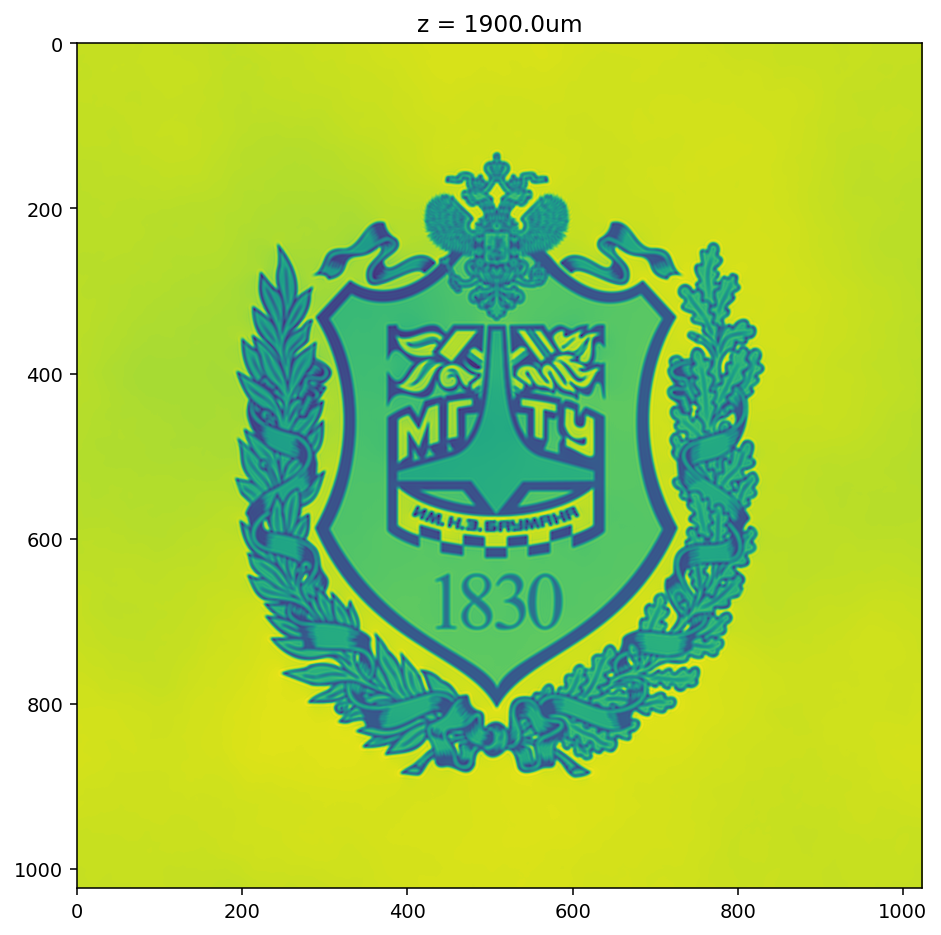

In [108]:
figure(figsize=(10, 8), dpi=140)

plt.imshow(focused_image)
plt.title(f'z = {dz_with_best_power  * 1000000}um')
plt.show()